In [1]:
import geopandas as gpd
from geocube.api.core import make_geocube
import pystac_client
import stackstac
import matplotlib.pyplot as plt
import planetary_computer
import xarray as xr
import numpy as np
import rioxarray
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
aoi = gpd.read_file('../../2_data/Koumbia_db/Koumbia_JECAM_2018-20-21.shp')
aoi_4326 = aoi.to_crs('EPSG: 4326')
bbox = aoi_4326.total_bounds
bands = ['B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B11', 'B12']
year = ['2018', '2020', '2021']

In [3]:
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
    )

In [4]:
s2_search_2018 = catalog.search(
        collections=["sentinel-2-l2a"],
        bbox= bbox,
        datetime= year[0] + '-01-01/' + year[0] + '-12-31',
        query={'eo:cloud_cover': {"lt": 100}, 
                's2:nodata_pixel_percentage': {'lt': 50},
                's2:mgrs_tile': {'eq': '30PVT'}},
        )
item2018 = s2_search_2018.item_collection()

In [5]:
petite_bbox = [415000, 1240000, 415000+1000, 1240000+1000]
stack2018 = stackstac.stack(item2018, resolution = 10, bounds = petite_bbox, chunksize= (69, 1, 100, 100))
stack2018 = stack2018.drop_duplicates(dim = 'time')
#stack2018 = stack2018.groupby('time').mean()
SCL = stack2018.sel(band = 'SCL')
stack2018 = stack2018.sel(band = bands)

cirrus = xr.where(SCL == 10, 1, 0) # cirrus pixels, binary mask 0, 1
highclouds = xr.where(SCL == 9, 1, 0) # High probability clouds, binary mask 0, 1
medclouds = xr.where(SCL == 8, 1, 0) # Medium probability clouds, binary mask 0, 1
unclass = xr.where(SCL == 7, 1, 0) # unclassified pixels, binary mask 0, 1
shaclouds = xr.where(SCL == 3, 1, 0) # Cloud shadows, binary mask 0, 1
saturated = xr.where(SCL == 1, 1, 0) # saturated pixels, binary mask 0, 1

## mannually check quality of final interpolation

mask = highclouds + medclouds + shaclouds + saturated + cirrus + unclass # Mask, binary mask 0, 1
maskedstack = stack2018.where(mask == 0, np.nan)

/Users/edgar/opt/anaconda3/envs/GeoDS/lib/python3.11/site-packages/stackstac/accumulate_metadata.py:168: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(


In [6]:
missingDOY = np.setdiff1d(np.arange(5, 370, 5), maskedstack.time.dt.dayofyear)

In [7]:
missingIndex = missingDOY/5

In [8]:
missingIndex

array([14., 26., 28., 43.])

In [9]:
npdata = np.array(maskedstack.values)

In [10]:
nodata = np.array([np.nan]*4*10*100*100).reshape(4, 10, 100, 100)

In [11]:
npdata.shape, nodata.shape

((69, 10, 100, 100), (4, 10, 100, 100))

In [12]:
temp = np.zeros((73, 10, 100, 100))

In [13]:
temp[:13, :, :, :] = npdata[:13, :, :, :]
temp[13, :, :, :] = nodata[0, :, :, :]
temp[14:25, :, :, :] = npdata[13:24, :, :, :]
temp[25, :, :, :] = nodata[1, :, :, :]
temp[26, :, :, :] = npdata[24, :, :, :]
temp[27, :, :, :] = nodata[2, :, :, :]
temp[28:42, :, :, :] = npdata[25:39, :, :, :]
temp[42, :, :, :] = nodata[3, :, :, :]
temp[43:, :, :, :] = npdata[39:, :, :, :]

In [14]:
temp

array([[[[ 812.,  789.,  767., ...,  588.,  576.,  574.],
         [ 824.,  744.,  664., ...,  389.,  513.,  567.],
         [ 772.,  689.,  705., ...,  487.,  572.,  628.],
         ...,
         [ 770.,  713.,  758., ...,  709.,  603.,  571.],
         [ 841.,  819.,  772., ...,  480.,  612.,  709.],
         [ 861.,  875.,  848., ...,  630.,  670.,  635.]],

        [[1210., 1152., 1098., ...,  893.,  882.,  955.],
         [1182., 1092., 1020., ...,  625.,  832.,  906.],
         [1094., 1046., 1074., ...,  838.,  939.,  952.],
         ...,
         [1232., 1216., 1206., ..., 1144., 1006.,  897.],
         [1338., 1350., 1268., ...,  836.,  992., 1156.],
         [1308., 1374., 1392., ..., 1104., 1128., 1090.]],

        [[1788., 1742., 1628., ..., 1344., 1274., 1520.],
         [1798., 1614., 1496., ...,  836., 1144., 1366.],
         [1676., 1548., 1658., ..., 1150., 1290., 1440.],
         ...,
         [1952., 1836., 1960., ..., 1586., 1302., 1226.],
         [2084., 2092., 19

In [15]:
test = temp[6, 1:4, :, :].transpose(1, 2, 0)
mintest = np.nanmin(test, axis=(0,1))
maxtest = np.nanmax(test, axis=(0,1))

In [16]:
test2 = (test - mintest) / (maxtest - mintest)

In [17]:
test2.shape

(100, 100, 3)

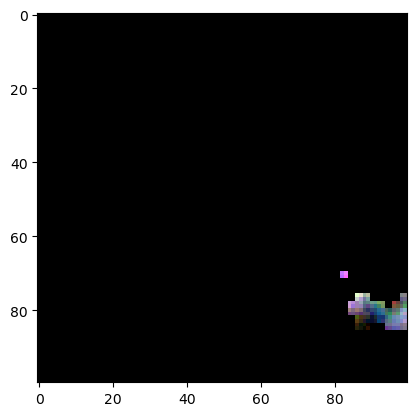

In [18]:
plt.imshow(test2)

In [19]:
from scipy.interpolate import interp1d

In [20]:
x = maskedstack.indexes['x']
y = maskedstack.indexes['y']
band = maskedstack.indexes['band']
dates2018 = [pd.to_datetime(doy-1, unit='D', origin=str(2018)) for doy in np.arange(5, 370, 5)]
time = pd.Index(dates2018, name = 'time')

In [21]:
temp2018 = xr.DataArray(
    data = temp,
    coords=dict(time = time,
                 band = band,
                 x = x,
                 y = y)
    
    )
temp2018._copy_attrs_from(maskedstack)

In [22]:
temp2018

<xarray.DataArray (time: 73, band: 10, x: 100, y: 100)>
array([[[[ 812.,  789.,  767., ...,  588.,  576.,  574.],
         [ 824.,  744.,  664., ...,  389.,  513.,  567.],
         [ 772.,  689.,  705., ...,  487.,  572.,  628.],
         ...,
         [ 770.,  713.,  758., ...,  709.,  603.,  571.],
         [ 841.,  819.,  772., ...,  480.,  612.,  709.],
         [ 861.,  875.,  848., ...,  630.,  670.,  635.]],

        [[1210., 1152., 1098., ...,  893.,  882.,  955.],
         [1182., 1092., 1020., ...,  625.,  832.,  906.],
         [1094., 1046., 1074., ...,  838.,  939.,  952.],
         ...,
         [1232., 1216., 1206., ..., 1144., 1006.,  897.],
         [1338., 1350., 1268., ...,  836.,  992., 1156.],
         [1308., 1374., 1392., ..., 1104., 1128., 1090.]],

        [[1788., 1742., 1628., ..., 1344., 1274., 1520.],
         [1798., 1614., 1496., ...,  836., 1144., 1366.],
         [1676., 1548., 1658., ..., 1150., 1290., 1440.],
         ...,
...
         ...,
         [2437., 2437., 2448., ..., 2672., 2546., 2546.],
         [2566., 2566., 2497., ..., 2747., 2629., 2629.],
         [2566., 2566., 2497., ..., 2747., 2629., 2629.]],

        [[3474., 3474., 3301., ..., 3298., 3355., 3355.],
         [3474., 3474., 3301., ..., 3298., 3355., 3355.],
         [3380., 3380., 3304., ..., 3270., 3410., 3410.],
         ...,
         [3732., 3732., 3902., ..., 3612., 3154., 3154.],
         [3914., 3914., 3948., ..., 3439., 3203., 3203.],
         [3914., 3914., 3948., ..., 3439., 3203., 3203.]],

        [[2283., 2283., 2136., ..., 2317., 2302., 2302.],
         [2283., 2283., 2136., ..., 2317., 2302., 2302.],
         [2145., 2145., 2160., ..., 2221., 2402., 2402.],
         ...,
         [2627., 2627., 2749., ..., 2550., 2090., 2090.],
         [2756., 2756., 2720., ..., 2469., 2272., 2272.],
         [2756., 2756., 2720., ..., 2469., 2272., 2272.]]]])
Coordinates:
  * time     (time) datetime64[ns] 2018-01-05 2018-01-10 ... 2018-12-31
  * band     (band) object 'B02' 'B03' 'B04' 'B05' ... 'B08' 'B8A' 'B11' 'B12'
  * x        (x) float64 4.15e+05 4.15e+05 4.15e+05 ... 4.16e+05 4.16e+05
  * y        (y) float64 1.241e+06 1.241e+06 1.241e+06 ... 1.24e+06 1.24e+06
Attributes:
    spec:        RasterSpec(epsg=32630, bounds=(415000, 1240000, 416000, 1241...
    crs:         epsg:32630
    transform:   | 10.00, 0.00, 415000.00|\n| 0.00,-10.00, 1241000.00|\n| 0.0...
    resolution:  10

In [23]:
interp2018 = temp2018.interpolate_na(dim="time", method="linear", use_coordinate = 'time')

In [24]:
interp2018

<xarray.DataArray (time: 73, band: 10, x: 100, y: 100)>
array([[[[ 812.,  789.,  767., ...,  588.,  576.,  574.],
         [ 824.,  744.,  664., ...,  389.,  513.,  567.],
         [ 772.,  689.,  705., ...,  487.,  572.,  628.],
         ...,
         [ 770.,  713.,  758., ...,  709.,  603.,  571.],
         [ 841.,  819.,  772., ...,  480.,  612.,  709.],
         [ 861.,  875.,  848., ...,  630.,  670.,  635.]],

        [[1210., 1152., 1098., ...,  893.,  882.,  955.],
         [1182., 1092., 1020., ...,  625.,  832.,  906.],
         [1094., 1046., 1074., ...,  838.,  939.,  952.],
         ...,
         [1232., 1216., 1206., ..., 1144., 1006.,  897.],
         [1338., 1350., 1268., ...,  836.,  992., 1156.],
         [1308., 1374., 1392., ..., 1104., 1128., 1090.]],

        [[1788., 1742., 1628., ..., 1344., 1274., 1520.],
         [1798., 1614., 1496., ...,  836., 1144., 1366.],
         [1676., 1548., 1658., ..., 1150., 1290., 1440.],
         ...,
...
         ...,
         [2437., 2437., 2448., ..., 2672., 2546., 2546.],
         [2566., 2566., 2497., ..., 2747., 2629., 2629.],
         [2566., 2566., 2497., ..., 2747., 2629., 2629.]],

        [[3474., 3474., 3301., ..., 3298., 3355., 3355.],
         [3474., 3474., 3301., ..., 3298., 3355., 3355.],
         [3380., 3380., 3304., ..., 3270., 3410., 3410.],
         ...,
         [3732., 3732., 3902., ..., 3612., 3154., 3154.],
         [3914., 3914., 3948., ..., 3439., 3203., 3203.],
         [3914., 3914., 3948., ..., 3439., 3203., 3203.]],

        [[2283., 2283., 2136., ..., 2317., 2302., 2302.],
         [2283., 2283., 2136., ..., 2317., 2302., 2302.],
         [2145., 2145., 2160., ..., 2221., 2402., 2402.],
         ...,
         [2627., 2627., 2749., ..., 2550., 2090., 2090.],
         [2756., 2756., 2720., ..., 2469., 2272., 2272.],
         [2756., 2756., 2720., ..., 2469., 2272., 2272.]]]])
Coordinates:
  * time     (time) datetime64[ns] 2018-01-05 2018-01-10 ... 2018-12-31
  * band     (band) object 'B02' 'B03' 'B04' 'B05' ... 'B08' 'B8A' 'B11' 'B12'
  * x        (x) float64 4.15e+05 4.15e+05 4.15e+05 ... 4.16e+05 4.16e+05
  * y        (y) float64 1.241e+06 1.241e+06 1.241e+06 ... 1.24e+06 1.24e+06
Attributes:
    spec:        RasterSpec(epsg=32630, bounds=(415000, 1240000, 416000, 1241...
    crs:         epsg:32630
    transform:   | 10.00, 0.00, 415000.00|\n| 0.00,-10.00, 1241000.00|\n| 0.0...
    resolution:  10

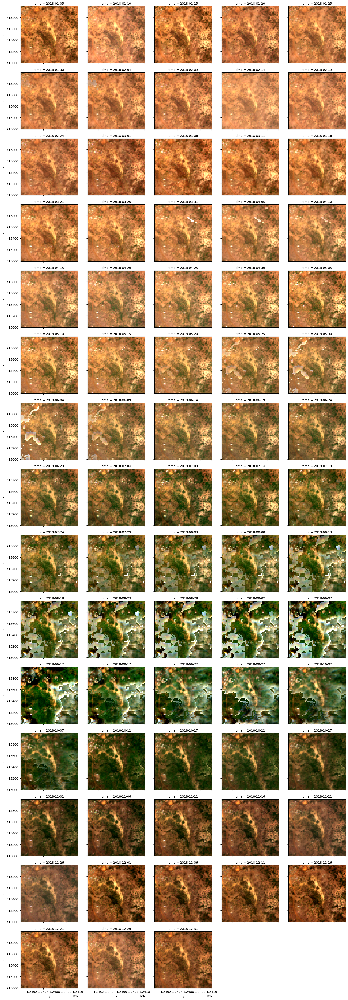

In [25]:
interp2018.sel(band = ['B04', 'B03', 'B02']).plot.imshow(rgb="band", col="time", col_wrap=5, robust=True)

In [26]:
minmax_bandtime = interp2018.quantile([0.02, 0.98], dim=['x', 'y'])

In [27]:
norm2018 = (interp2018 - minmax_bandtime[0, :, :]) / (minmax_bandtime[1, :, :] - minmax_bandtime[0, :, :])

In [34]:
norm2018_2 = norm2018.where(norm2018 > 0, 0, drop=True)
norm2018_2 = norm2018_2.where(norm2018_2 < 1, 1, drop=True)

In [35]:
norm2018_2

<xarray.DataArray (time: 73, band: 10, x: 100, y: 100)>
array([[[[0.43351064, 0.40292553, 0.37367021, ..., 0.1356383 ,
          0.11968085, 0.11702128],
         [0.44946809, 0.34308511, 0.23670213, ..., 0.        ,
          0.03590426, 0.10771277],
         [0.38031915, 0.26994681, 0.2912234 , ..., 0.00132979,
          0.1143617 , 0.18882979],
         ...,
         [0.37765957, 0.3018617 , 0.36170213, ..., 0.29654255,
          0.15558511, 0.11303191],
         [0.47207447, 0.44281915, 0.38031915, ..., 0.        ,
          0.16755319, 0.29654255],
         [0.49867021, 0.51728723, 0.48138298, ..., 0.19148936,
          0.24468085, 0.1981383 ]],

        [[0.37533274, 0.32386868, 0.27595386, ..., 0.09405501,
          0.08429459, 0.14906832],
         [0.35048802, 0.27062999, 0.20674357, ..., 0.        ,
          0.03992902, 0.10559006],
         [0.27240461, 0.22981366, 0.25465839, ..., 0.04525288,
          0.13487134, 0.14640639],
...
         [0.53053982, 0.53053982, 0.63638628, ..., 0.45582467,
          0.17066185, 0.17066185],
         [0.64385779, 0.64385779, 0.66502708, ..., 0.34811033,
          0.20117054, 0.20117054],
         [0.64385779, 0.64385779, 0.66502708, ..., 0.34811033,
          0.20117054, 0.20117054]],

        [[0.24429092, 0.24429092, 0.16432574, ..., 0.26278627,
          0.25462656, 0.25462656],
         [0.24429092, 0.24429092, 0.16432574, ..., 0.26278627,
          0.25462656, 0.25462656],
         [0.16922156, 0.16922156, 0.17738128, ..., 0.21056411,
          0.30902464, 0.30902464],
         ...,
         [0.43142033, 0.43142033, 0.497786  , ..., 0.38953381,
          0.13930262, 0.13930262],
         [0.50159386, 0.50159386, 0.48201055, ..., 0.34547136,
          0.23830713, 0.23830713],
         [0.50159386, 0.50159386, 0.48201055, ..., 0.34547136,
          0.23830713, 0.23830713]]]])
Coordinates:
  * time      (time) datetime64[ns] 2018-01-05 2018-01-10 ... 2018-12-31
  * band      (band) object 'B02' 'B03' 'B04' 'B05' ... 'B08' 'B8A' 'B11' 'B12'
  * x         (x) float64 4.15e+05 4.15e+05 4.15e+05 ... 4.16e+05 4.16e+05
  * y         (y) float64 1.241e+06 1.241e+06 1.241e+06 ... 1.24e+06 1.24e+06
    quantile  float64 0.02

In [36]:
np.max(norm2018_2)

<xarray.DataArray ()>
array(1.)
Coordinates:
    quantile  float64 0.02

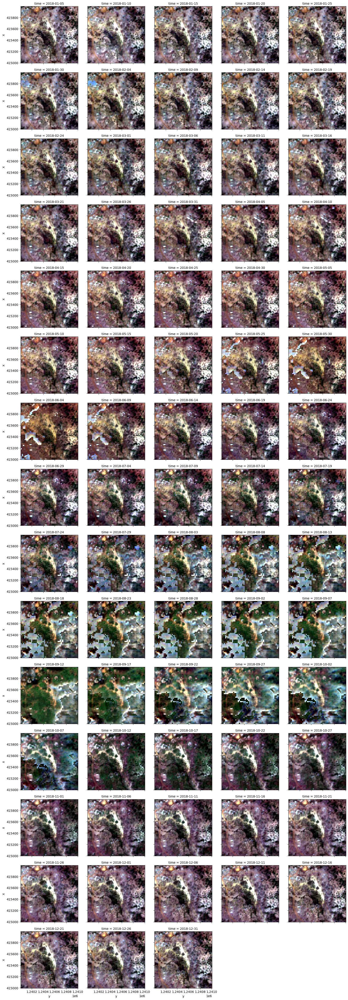

In [37]:
norm2018_2.sel(band = ['B04', 'B03', 'B02']).plot.imshow(rgb="band", col="time", col_wrap=5, robust=True)

In [80]:
norm2018.min(dim=['x', 'y'])

<xarray.DataArray (time: 73, band: 10)>
array([[-0.25797872, -0.22005324, -0.2863354 , -0.22980606, -0.38738111,
        -0.41059612, -0.43473335, -0.45144997, -0.27611018, -0.16771502],
       [-0.23289665, -0.19433594, -0.25030364, -0.15015325, -0.20334017,
        -0.22455211, -0.30268859, -0.33725402, -0.14492963, -0.10884233],
       [-0.2377451 , -0.23672328, -0.25901442, -0.20197966, -0.33119079,
        -0.36693939, -0.38450199, -0.39073135, -0.2421697 , -0.19662309],
       [-0.25384615, -0.227169  , -0.28860029, -0.18076023, -0.28182926,
        -0.32200824, -0.50698324, -0.43196203, -0.22096398, -0.17898816],
       [-0.22833333, -0.21885522, -0.29727839, -0.20783413, -0.28856376,
        -0.3349926 , -0.47468684, -0.39139072, -0.23196833, -0.19702796],
       [-0.23119063, -0.2190695 , -0.29741755, -0.18665039, -0.2852381 ,
        -0.3267449 , -0.46986563, -0.34319066, -0.18823722, -0.18601976],
       [-0.23499784, -0.19684152, -0.31067785, -0.20742721, -0.26737864,
        -0.29979912, -0.40484207, -0.29018761, -0.27637502, -0.16229397],
       [-0.28291695, -0.22399948, -0.34502832, -0.21924053, -0.25108746,
        -0.30599497, -0.41925466, -0.29419067, -0.17381994, -0.15897831],
       [-0.23125   , -0.1800554 , -0.30538922, -0.2073039 , -0.27235532,
        -0.27266628, -0.33456406, -0.27099458, -0.17385445, -0.18415206],
       [-0.24085833, -0.18842365, -0.31898498, -0.16583738, -0.24307981,
        -0.26425948, -0.38719761, -0.26884092, -0.19852798, -0.17925749],
...
       [-0.11803279, -0.1395287 , -0.11280942, -0.14832431, -0.29110843,
        -0.30965527, -0.33441461, -0.3127484 , -0.63617468, -0.28901616],
       [-0.10452704, -0.12704403, -0.11777599, -0.12514684, -0.24813176,
        -0.23841583, -0.27683616, -0.22191469, -0.63895877, -0.28656073],
       [-0.13059861, -0.12373389, -0.12052308, -0.12628943, -0.15212499,
        -0.16922402, -0.22457627, -0.18329041, -0.63353476, -0.28517195],
       [-0.14426634, -0.12652263, -0.12470998, -0.1485229 , -0.17432533,
        -0.16865487, -0.22366522, -0.18596234, -0.54035047, -0.25145307],
       [-0.14345729, -0.16309223, -0.14048294, -0.13512517, -0.12224006,
        -0.14665491, -0.28046655, -0.17256779, -0.67195393, -0.28892633],
       [-0.18210361, -0.17230444, -0.15372162, -0.13946138, -0.20031525,
        -0.19404861, -0.3136    , -0.12612972, -0.35595056, -0.14256965],
       [-0.14828618, -0.15901523, -0.17273092, -0.15675889, -0.11689906,
        -0.11789756, -0.23319027, -0.15288384, -0.20281534, -0.14640362],
       [-0.17951457, -0.18495935, -0.18866621, -0.17555705, -0.29772101,
        -0.37778695, -0.47260626, -0.39076912, -0.18137015, -0.14963351],
       [-0.20249221, -0.1957878 , -0.21722482, -0.17848292, -0.24314755,
        -0.29399818, -0.39101498, -0.34338298, -0.3906433 , -0.1344721 ],
       [-0.20689655, -0.1834885 , -0.20847167, -0.17145761, -0.2907056 ,
        -0.32514096, -0.40169492, -0.32887858, -0.24898823, -0.15934287]])
Coordinates:
  * time      (time) datetime64[ns] 2018-01-05 2018-01-10 ... 2018-12-31
  * band      (band) object 'B02' 'B03' 'B04' 'B05' ... 'B08' 'B8A' 'B11' 'B12'
    quantile  float64 0.02

In [81]:
norm2018.max(dim=['x', 'y'])

<xarray.DataArray (time: 73, band: 10)>
array([[1.75      , 1.47027507, 1.3689441 , 1.40487306, 1.38219608,
        1.38250325, 1.51509802, 1.45149402, 1.58625278, 1.64566734],
       [2.00436681, 1.6171875 , 1.42239076, 1.45440476, 1.4203068 ,
        1.40466228, 1.43757711, 1.36215627, 1.39010105, 1.53355824],
       [2.04166667, 1.50711012, 1.40985577, 1.34471753, 1.38167146,
        1.39990457, 1.53186576, 1.48106496, 1.58997244, 1.66884532],
       [2.08615385, 1.42732667, 1.44155844, 1.42201598, 1.36710259,
        1.38641633, 1.53072626, 1.45886076, 1.59412292, 1.67818779],
       [1.79333333, 1.48709315, 1.44028997, 1.38846107, 1.40608389,
        1.40114873, 1.55434749, 1.47473948, 1.61283101, 1.65930779],
       [1.93276919, 1.44422468, 1.45457867, 1.38356245, 1.39089171,
        1.40515611, 1.51867043, 1.43017664, 1.61106241, 1.64828269],
       [1.88533485, 1.42973058, 1.45826827, 1.3592233 , 1.37448747,
        1.39055827, 1.51011647, 1.40341702, 1.55277528, 1.62999103],
       [2.04176715, 1.45020671, 1.43660605, 1.35305393, 1.37744457,
        1.39181442, 1.49689441, 1.42853985, 1.57297133, 1.60744733],
       [1.99166667, 1.43767313, 1.44111776, 1.34763735, 1.35109944,
        1.39497435, 1.46344371, 1.36397272, 1.58149479, 1.63343033],
       [1.8976717 , 1.68226601, 1.46052113, 1.36118578, 1.47087904,
        1.40898226, 1.51326773, 1.37734714, 1.50583862, 1.53901697],
...
       [2.19344262, 1.56028526, 1.61915571, 1.71181226, 1.61631485,
        1.50388681, 1.488145  , 1.37503787, 1.56136602, 1.64536494],
       [2.28479455, 1.58616352, 1.65132097, 1.76574615, 1.67276903,
        1.5542742 , 1.46798493, 1.45334045, 1.58839145, 1.64329767],
       [2.42999058, 1.66465239, 1.66842   , 1.83066604, 1.72866056,
        1.63066881, 1.54025424, 1.59393054, 1.59024235, 1.63923627],
       [2.12453761, 1.58109665, 1.65081206, 1.75601211, 1.62755127,
        1.60180995, 1.54401154, 1.53288409, 1.55463785, 1.64110068],
       [2.18635543, 1.57282068, 1.64537334, 1.74861004, 1.65689208,
        1.60103674, 1.4690818 , 1.4598783 , 1.61206011, 1.64044912],
       [2.11145997, 1.65327696, 1.61899514, 1.68443799, 1.73200144,
        1.68840218, 1.5728    , 1.64603826, 1.65252802, 1.79128956],
       [1.88704005, 1.63224455, 1.59484447, 1.71109981, 1.71732293,
        1.64778144, 1.56938484, 1.57071839, 1.71259896, 1.78059381],
       [2.23132158, 1.69715447, 1.68417415, 1.78846645, 1.79104944,
        1.78894554, 1.70410263, 1.72291114, 1.74641114, 1.85065264],
       [1.87850467, 1.6901907 , 1.60378192, 1.74256105, 1.7021885 ,
        1.68952245, 1.60399334, 1.56440565, 1.68647578, 1.76021908],
       [1.75862069, 1.724053  , 1.64824635, 1.71679007, 1.79622127,
        1.7170586 , 1.57627119, 1.67100736, 1.80069734, 1.81041179]])
Coordinates:
  * time      (time) datetime64[ns] 2018-01-05 2018-01-10 ... 2018-12-31
  * band      (band) object 'B02' 'B03' 'B04' 'B05' ... 'B08' 'B8A' 'B11' 'B12'
    quantile  float64 0.02

In [82]:
mintest = interp2018.min(dim=['x', 'y'])
maxtest = interp2018.max(dim=['x', 'y'])

In [88]:
norm2018_v2 = (interp2018 - mintest) / (maxtest - mintest)

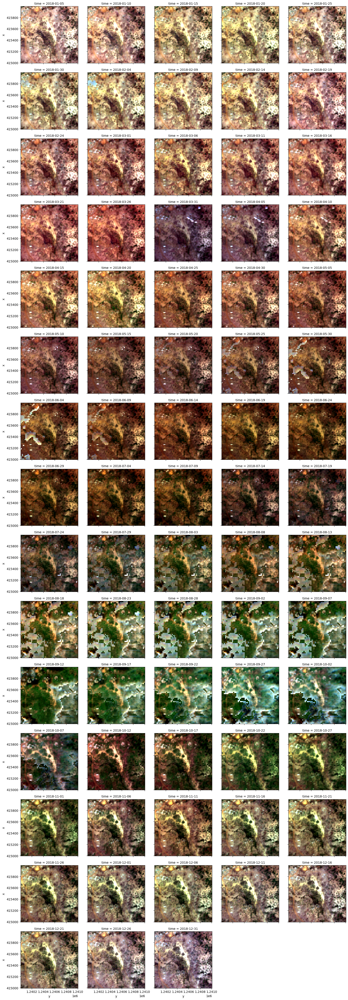

In [89]:
norm2018_v2.sel(band = ['B04', 'B03', 'B02']).plot.imshow(rgb="band", col="time", col_wrap=5, robust=True)

In [90]:
norm2018_v2.min(dim=['x', 'y'])

<xarray.DataArray (time: 73, band: 10)>
array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
...
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])
Coordinates:
  * time     (time) datetime64[ns] 2018-01-05 2018-01-10 ... 2018-12-31
  * band     (band) object 'B02' 'B03' 'B04' 'B05' ... 'B08' 'B8A' 'B11' 'B12'

In [91]:
norm2018_v2.max(dim=['x', 'y'])

<xarray.DataArray (time: 73, band: 10)>
array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
...
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])
Coordinates:
  * time     (time) datetime64[ns] 2018-01-05 2018-01-10 ... 2018-12-31
  * band     (band) object 'B02' 'B03' 'B04' 'B05' ... 'B08' 'B8A' 'B11' 'B12'